### **Import Libraries / Modules**

In [ ]:
!pip install evaluate
!pip install datasets
!pip install rouge_score
!pip install transformers
!pip install accelerate --upgrade
!pip install seaborn

In [ ]:
import torch
import evaluate

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import datasets
from datasets import load_dataset, Dataset, DatasetDict
from transformers import set_seed

import random
from google.colab import drive
#i have not used some of them
from transformers import (
    T5Tokenizer,
    T5ForConditionalGeneration,
    TrainingArguments,
    Trainer
)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cpu


In [ ]:
set_seed(42)

In [ ]:
ds = load_dataset("potsawee/podcast_summary_assessment", split = "evaluation")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/982 [00:00<?, ?B/s]

(…)-00000-of-00001-35a6214df2b58edc.parquet:   0%|          | 0.00/12.0M [00:00<?, ?B/s]

Generating evaluation split:   0%|          | 0/3580 [00:00<?, ? examples/s]

In [ ]:
ds_df = ds.to_pandas()

In [ ]:
ds = ds_df.drop(columns = ['score', 'attributes', 'episode_id', 'system_id'])

In [ ]:
ds.head()

,transcript,summary
0,Are you ready? Are you going to do stuff you w...,Welcome to the first episode of our podcast! I...
1,You're listening to the Elevate main podcast t...,You must love the Lord your God with all your ...
2,Welcome back to another episode of daily Fortn...,Challenge Tip -Item Shop -Tip of the Day Insta...
3,"We have to pay the bills, and if you guys have...",This week on the show we talk about what to do...
4,Before we get jumped into this first episode j...,"Welcome to our first episode! If you do, pleas..."


In [ ]:
def word_count(sentence):
    sentences = sentence.split()
    return len(sentences)

In [ ]:
ds['num_words_podcast'] = ds['transcript'].apply(word_count)
ds['num_words_summary'] = ds['summary'].apply(word_count)
ds.head()

,transcript,summary,num_words_podcast,num_words_summary
0,Are you ready? Are you going to do stuff you w...,Welcome to the first episode of our podcast! I...,3923,73
1,You're listening to the Elevate main podcast t...,You must love the Lord your God with all your ...,7942,147
2,Welcome back to another episode of daily Fortn...,Challenge Tip -Item Shop -Tip of the Day Insta...,2157,43
3,"We have to pay the bills, and if you guys have...",This week on the show we talk about what to do...,12820,22
4,Before we get jumped into this first episode j...,"Welcome to our first episode! If you do, pleas...",14026,50


In [ ]:
ds.describe()

,num_words_podcast,num_words_summary
count,3580.000000,3580.000000
mean,5272.849162,76.720950
std,4162.700377,55.984416
min,47.000000,2.000000
25%,1659.000000,40.000000
50%,5048.000000,54.000000
75%,8129.000000,102.000000
max,19901.000000,441.000000


Upper whisker: 15474.0
Q3: 8129.0
Q2: 5048.0
Q1: 1659.0
Lower whisker: 47.0


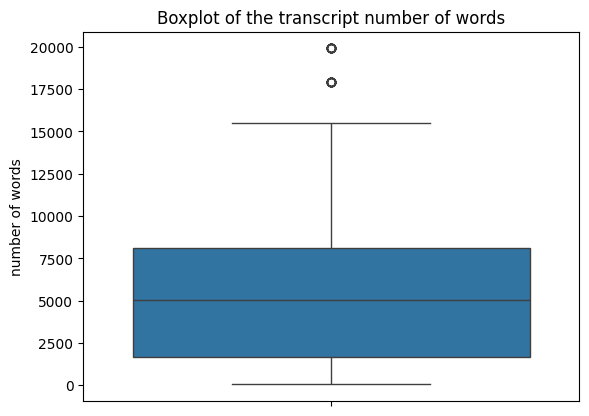

In [ ]:
sns.boxplot(ds["num_words_podcast"])
plt.ylabel("number of words")
plt.title("Boxplot of the transcript number of words")

lines = plt.gca().lines[:6]
all_lines = [lines[i].get_ydata()[0] for i in range(5)]

Q1,Q3,podcast_lower_whisker,podcast_upper_whisker, Q2 = all_lines

print("Upper whisker:", podcast_upper_whisker)
print("Q3:", Q3)
print("Q2:", Q2)
print("Q1:", Q1)
print("Lower whisker:", podcast_lower_whisker)

Upper whisker: 195.0
Q3: 102.0
Q2: 54.0
Q1: 40.0
Lower whisker: 2.0


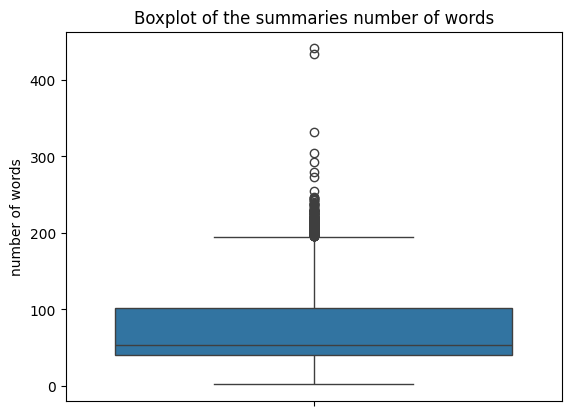

In [ ]:
sns.boxplot(ds["num_words_summary"])
plt.ylabel("number of words")
plt.title("Boxplot of the summaries number of words")

lines = plt.gca().lines[:6]
all_lines = [lines[i].get_ydata()[0] for i in range(5)]

Q1,Q3,summary_lower_whisker,summary_upper_whisker, Q2 = all_lines

print("Upper whisker:", summary_upper_whisker)
print("Q3:", Q3)
print("Q2:", Q2)
print("Q1:", Q1)
print("Lower whisker:", summary_lower_whisker)

In [ ]:
new_ds = ds[(ds['num_words_summary'] <= summary_upper_whisker) & (ds['num_words_podcast'] <= podcast_upper_whisker)]

In [ ]:
new_ds = ds.drop(columns = ['num_words_podcast', 'num_words_summary'])

In [ ]:
new_ds = new_ds.sample(frac = 0.1, random_state = 42)
new_ds.reset_index(drop=True, inplace=True)

In [ ]:
len(new_ds)

358

In [ ]:
train_ratio = 0.7
val_ratio = 0.15

train_split = int(len(new_ds) * train_ratio)
val_split = int(len(new_ds) * (train_ratio + val_ratio))

train_ds = new_ds.iloc[:train_split]
val_ds = new_ds.iloc[train_split:val_split]
test_ds = new_ds.iloc[val_split:]

In [ ]:
train_dataset = Dataset.from_dict(train_ds)
val_dataset = Dataset.from_dict(val_ds)
test_dataset = Dataset.from_dict(test_ds)


dataset = DatasetDict({
    "train": train_dataset,
    "validation": val_dataset,
    "test": test_dataset
})
dataset

DatasetDict({
    train: Dataset({
        features: ['transcript', 'summary'],
        num_rows: 250
    })
    validation: Dataset({
        features: ['transcript', 'summary'],
        num_rows: 54
    })
    test: Dataset({
        features: ['transcript', 'summary'],
        num_rows: 54
    })
})

In [ ]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("t5-small")
pad_on_right = tokenizer.padding_side == "right"

tokenizer_config.json:   0%|          | 0.00/2.32k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

In [ ]:
tokenizer("My name is Zarina!")

{'input_ids': [499, 564, 19, 24374, 77, 9, 55, 1], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1]}

In [ ]:
max_input_length = 1024
max_target_length = 128

In [ ]:
def preprocess_function(examples):
    inputs = [f"summarize: {transcript}" for transcript in examples['transcript']]
    model_inputs = tokenizer(
        inputs,
        max_length=max_input_length,
        truncation=True,
        padding= 'max_length'
    )
    with tokenizer.as_target_tokenizer():
        labels = tokenizer(
            examples['summary'],
            max_length=max_target_length,
            truncation = True
            )
    model_inputs["labels"] = labels["input_ids"]
    return model_inputs

In [ ]:
preprocess_function(train_dataset[:2])

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:3953: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


{'input_ids': [[21603, 10, 4073, 1075, 19, 3, 9, 7370, 17893, 11, 2291, 13, 14490, 8618, 5, 216, 92, 9855, 8, 307, 18, 24549, 1355, 1477, 11, 5456, 1012, 10825, 6070, 8661, 5, 101, 6812, 81, 4924, 15093, 7, 6, 4798, 159, 51, 11, 12517, 8, 701, 13, 31274, 4134, 82, 4806, 5, 210, 159, 5012, 11, 125, 768, 19, 2049, 78, 231, 21, 2065, 53, 12, 1350, 12, 140, 5, 27, 31, 51, 78, 1095, 24, 25, 3495, 91, 12, 140, 30640, 5, 94, 31, 7, 2997, 3, 9, 11235, 12, 217, 25, 5, 94, 31, 7, 118, 186, 203, 5, 264, 27, 31, 162, 118, 479, 1039, 12, 48, 21, 3, 9, 182, 307, 97, 5, 264, 2763, 25, 21, 578, 140, 5, 499, 5565, 5, 27, 47, 1631, 30, 8, 194, 270, 81, 149, 27, 3492, 95, 1107, 270, 469, 11, 30, 80, 593, 5, 11475, 6, 2087, 34, 1550, 223, 944, 203, 6, 68, 167, 1310, 5, 27, 317, 27, 1219, 25, 27, 4686, 12, 43, 4037, 3, 849, 729, 36, 82, 3763, 21, 3, 9, 1350, 5, 275, 8, 166, 706, 5, 27, 1736, 376, 3, 88, 3, 7, 144, 323, 11, 3, 88, 243, 27, 131, 764, 45, 48, 1237, 2542, 5, 37, 22720, 5873, 47, 78, 9748, 5, 2

In [ ]:
# Apply the function to the whole dataset
tokenized_train = train_dataset.map(
    preprocess_function,
    batched=True,
    )
tokenized_valid = val_dataset.map(
    preprocess_function,
    batched=True,
    )


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Map:   0%|          | 0/54 [00:00<?, ? examples/s]

In [ ]:
from transformers import AutoModelForSeq2SeqLM, DataCollatorForSeq2Seq, Seq2SeqTrainingArguments, Seq2SeqTrainer

model = AutoModelForSeq2SeqLM.from_pretrained("t5-small")

In [ ]:

data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

In [ ]:
training_args = Seq2SeqTrainingArguments(
    output_dir="t5-results",
    num_train_epochs=5,
    per_device_train_batch_size= 4,
    per_device_eval_batch_size=4,
    weight_decay=0.01,
    logging_dir="t5-results",
    evaluation_strategy='epoch',
    save_strategy='epoch',
    #eval_steps=400,
    save_total_limit=2,
    report_to='tensorboard',
    learning_rate=1e-5,
    predict_with_generate=True,
)

/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
rouge = evaluate.load("rouge")

In [ ]:
import nltk
nltk.download('punkt_tab')
import numpy as np

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    decoded_preds = tokenizer.batch_decode(predictions, skip_special_tokens=True)
    # Replace -100 in the labels as we can't decode them.
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)

    # Rouge expects a newline after each sentence
    decoded_preds = ["\n".join(nltk.sent_tokenize(pred.strip())) for pred in decoded_preds]
    decoded_labels = ["\n".join(nltk.sent_tokenize(label.strip())) for label in decoded_labels]
    result = rouge.compute(predictions=decoded_preds, references=decoded_labels, use_stemmer=True, use_aggregator=True)
    # Extract a few results
    result = {key: value * 100 for key, value in result.items()}

    # Add mean generated length
    prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in predictions]
    result["gen_len"] = np.mean(prediction_lens)

    return {k: round(v, 4) for k, v in result.items()}

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
import gc
gc.collect()

3303

In [ ]:
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_train,
    eval_dataset=tokenized_valid,
    data_collator=data_collator,
    tokenizer= tokenizer,
    compute_metrics=compute_metrics,
    )



<ipython-input-100-22d7dd30814a>:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Rouge1,Rouge2,Rougel,Rougelsum,Gen Len
1,No log,2.424977,16.323100,6.094000,13.079900,15.015600,20.000000
2,No log,2.340925,15.951700,6.597700,13.054200,14.964700,20.000000
3,No log,2.303315,17.479700,7.079600,13.965400,15.882500,20.000000
4,No log,2.287018,16.412100,6.289000,13.134900,14.895300,20.000000
5,No log,2.282166,17.097300,6.340500,13.617800,15.385700,20.000000


TrainOutput(global_step=315, training_loss=2.599562290736607, metrics={'train_runtime': 7988.7124, 'train_samples_per_second': 0.156, 'train_steps_per_second': 0.039, 'total_flos': 338354503680000.0, 'train_loss': 2.599562290736607, 'epoch': 5.0})

In [ ]:
tokenized_test = test_dataset.map(
    preprocess_function,
    batched=True,
    )

Map:   0%|          | 0/54 [00:00<?, ? examples/s]

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:3953: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


In [ ]:
predictions = trainer.predict(tokenized_test)

In [ ]:
metrics = predictions.metrics

In [ ]:
metrics

{'test_loss': 2.185107469558716,
 'test_rouge1': 15.2797,
 'test_rouge2': 4.9261,
 'test_rougeL': 12.1246,
 'test_rougeLsum': 13.2043,
 'test_gen_len': 20.0,
 'test_runtime': 192.4828,
 'test_samples_per_second': 0.281,
 'test_steps_per_second': 0.073}

In [ ]:
if training_args.predict_with_generate:
  predictions = tokenizer.batch_decode(predictions.predictions, skip_special_tokens=True, clean_up_tokenization_spaces=True)
  predictions = [pred.strip() for pred in predictions]

In [ ]:
test_dataset["transcript"][1]

"The night may be long and the dark maybe deep but the answers are there to be found whether it's the normal the abnormal or the Paranormal you're in the right place. Let's go beyond reality. We got a great show tonight. I'm really excited to have Kelly coffee with a she's returning guest also a renowned psychic. She believes everyone is able to achieve this level of awareness if they're willing to unblock themselves, and she's following her life's mission in helping Humanity. Let go of whatever stands in their way of achieving this Kelly. Welcome back to be on reality great to have you here tonight. Thank you for having me back hug daughter of mine. You sound like you might be getting over something you doing? Okay. Yeah. I live in Breckenridge, Colorado and I live on top of a mountain at about 11:00. Deed and it's typically like three below zero nine below zero, you know consistently and I just got caught outside a little bit too long breathing the cold air and I think I freezerburns

In [ ]:
test_dataset["summary"][1]

'In this episode of Beyond Reality, JV talks with Kelly Coffee, a renowned Psychic and Psychic Medium, about the Coronavirus and how she believes everyone can achieve a higher level of awareness if they are willing to unblock themselves.\n'

In [ ]:
predictions[1]

"I'm really excited to have Kelly coffee with a she's returning guest also a"

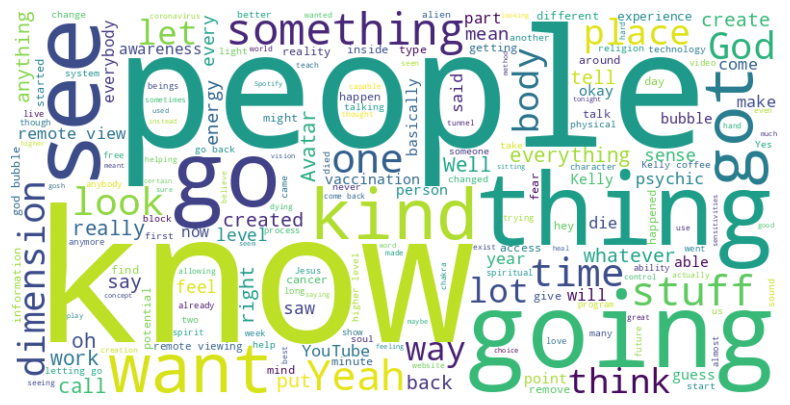

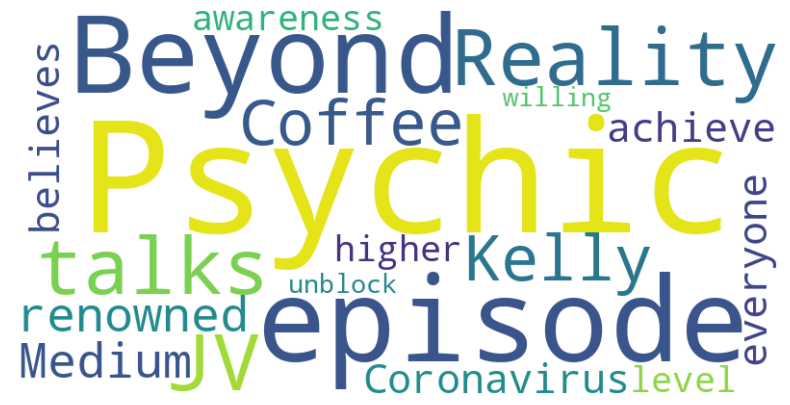

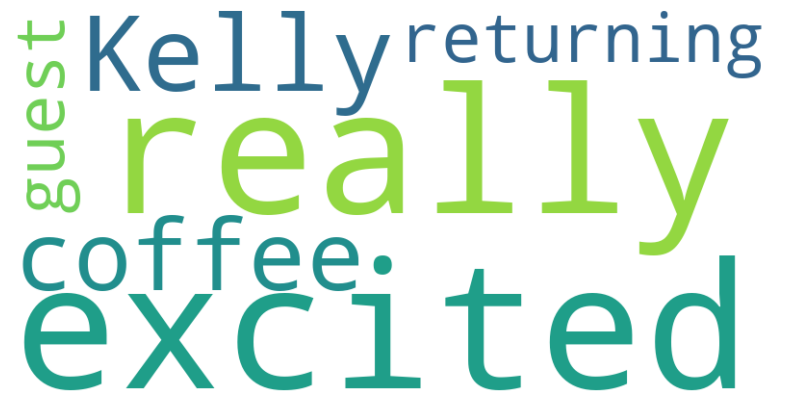

In [ ]:
from wordcloud import WordCloud

def plot_wordcloud(text):
  wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

plot_wordcloud(test_dataset["transcript"][1])
plot_wordcloud(test_dataset["summary"][1])
plot_wordcloud(predictions[1])

In [ ]:
!pip install bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 89.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.2/84.2 kB 7.7 MB/s eta 0:00:00


In [ ]:
encoder_input_ids = tokenizer("In this episode of Beyond Reality, JV talks with Kelly Coffee, a renowned Psychic and Psychic Medium, about the Coronavirus and how she believes everyone can achieve a higher level of awareness if they are willing to unblock themselves.\n", return_tensors="pt", add_special_tokens=True).input_ids
with tokenizer.as_target_tokenizer():
  decoder_input_ids = tokenizer("I'm really excited to have Kelly coffee with a she's returning guest also a", return_tensors="pt", add_special_tokens=True).input_ids

outputs = model(input_ids = encoder_input_ids, decoder_input_ids = decoder_input_ids, output_attentions = True)

encoder_text = tokenizer.convert_ids_to_tokens(encoder_input_ids[0])
decoder_text = tokenizer.convert_ids_to_tokens(decoder_input_ids[0])



/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:3953: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


In [ ]:
from bertviz import model_view
model_view(
      encoder_attention=outputs.encoder_attentions,
      decoder_attention=outputs.decoder_attentions,
      cross_attention=outputs.cross_attentions,
      encoder_tokens= encoder_text,
      decoder_tokens = decoder_text
      )


<IPython.core.display.Javascript object>